In [59]:
# !/home/arash/anaconda3/bin/pip install progressbar2

In [60]:
import torch
import torch.nn as nn
import torch.utils
from torchvision import datasets, transforms
import torchvision.utils
import numpy as np
import matplotlib.pyplot as plt

In [61]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

import itertools
import time

# from progressbar import progressbar as pb

In [62]:
# FOR DEBUG PURPOSES
class Timer:
    def __init__(self, msg):
        self.msg = msg
        
    def __enter__(self):
        torch.cuda.synchronize()
        self.start = time.process_time()
        return self

    def __exit__(self, *args):
        torch.cuda.synchronize()
        self.end = time.process_time()
        self.interval = self.end - self.start
        
        print('{}: {:.2f} sec'.format(self.msg, self.interval))

In [63]:
manualSeed = 42
random.seed(manualSeed)
torch.manual_seed(manualSeed)

In [96]:
data.shape

torch.Size([50, 1, 64, 64])

In [64]:
n_gaussian = 3  # size of latent gaussian variable
block_size = 1  # size of coordinate search blocks
n_rounds = 3  # number of coordinate search rounds 

# n_b = 0  # size of the latent binary variable
# n_o = 0  # size of the latent one-hot variable

batch_size = 50  # samples of data distribution at each iteration
latent_batch_size = np.power(32, block_size)

n_epochs = 200

In [65]:
img_size = 64  # desired resized image size
nc = 1  # number of image channels
# workers = 2  # number of workers for dataloader

In [66]:
from sklearn.datasets import fetch_olivetti_faces

# Load the faces datasets
data = fetch_olivetti_faces()
my_x = np.expand_dims(data.images, 1)

dataset_mean, dataset_std = 0.5470, 0.1725
tensor_x = torch.Tensor(my_x)  # transform to torch tensor
# tensor_x = (tensor_x - dataset_mean) / dataset_std  # (tensor_x - tensor_x.mean()) / tensor_x.std()

my_dataset = torch.utils.data.TensorDataset(tensor_x) # create your datset
my_dataloader = torch.utils.data.DataLoader(my_dataset, batch_size=batch_size, shuffle=True) # create your dataloader

In [67]:
use_cuda = torch.cuda.is_available()
gpu_ids = '0,1'
gpu_ids = [int(s) for s in gpu_ids.split(',')]
device = torch.device("cuda:{}".format(gpu_ids[0]) if use_cuda else "cpu")

# if len(gpu_ids) > 0:
#     torch.cuda.set_device(gpu_ids[0])

torch.manual_seed(42)
np.random.seed(42)

# # Should the default pytorch URL may fail, edit the source code of EMNIST function and update the URL
# # E.g: vim ~/anaconda3/lib/python3.7/site-packages/torchvision/datasets/mnist.py
# # Correct URL as of Jan 2020: https://cloudstor.aarnet.edu.au/plus/s/ZNmuFiuQTqZlu9W/download



# dataset_mean, dataset_std = 0.1751, 0.3332
# train_loader = torch.utils.data.DataLoader(
#     datasets.EMNIST('../data', split='balanced', train=True, download=True,
#                     transform=transforms.Compose([
# #                         transforms.Resize(img_size),
#                         transforms.ToTensor(),
#                         transforms.Normalize((dataset_mean,), (dataset_std,))
#                     ])),
#     batch_size=batch_size, shuffle=True, drop_last=True)


# train_loader = torch.utils.data.DataLoader(
#     datasets.MNIST('../data', train=True, download=True,
#                    transform=transforms.Compose([
#                        transforms.ToTensor(),
#                        transforms.Normalize((0.1307,), (0.3081,))
#                    ])),
#     batch_size=batch_size, shuffle=True, drop_last=True)

In [68]:
class BlockCoordinateSearch():
    def __init__(self, batch_size, latent_batch_size, n_gaussian, n_rounds, block_size, criterion_no_reduction, device, netG):
        """
        Block coordinate grid search optimizer over the distribution of points 
        in the latent space.
        
        Args:
            criterion_no_reduction: loss function to compare, and MUST NOT have reduction.
        """
        
#         self.m = torch.distributions.multivariate_normal.MultivariateNormal(
#             torch.zeros(block_size), 
#             torch.eye(block_size))
        
        self.batch_size = batch_size
        self.latent_batch_size = latent_batch_size
        self.n_gaussian = n_gaussian
        self.block_size = block_size
        
        self.n_rounds = n_rounds
        
#         self.netG = netG
        self.criterion_no_reduction = criterion_no_reduction
        
#         if device.type == 'cuda':
#             torch.cuda.set_device(device)
#             self.torch = torch.cuda
#         else:
#             self.torch = torch
        self.device = device
        self.netG = netG
        
    def _sample_block(self, old_z, block_idx):
        """
        Takes the best codes and perturbs
        
        Args:
            old_z: batch_size x n_gaussian
        Returns:
            new_z: batch_size x latent_batch_size x n_gaussian
        """
        
#         gaussian_samples = torch.randn(self.batch_size, self.latent_batch_size, self.block_size, device=device)
        
        new_z = old_z.unsqueeze(1).repeat(1, self.latent_batch_size, 1)
        new_z[:, :, block_idx * self.block_size:(block_idx + 1) * self.block_size].normal_()
        
        return new_z
        
#     def _row_wise_repeat(mat, n_rep):
#         """
#         pytorch equivalent of numpy.repeat
#         """
#         n_rows = mat.shape[0]
#         return mat[np.arange(n_rows).repeat(n_rep), :]  # WARNING: np.repeat has a different functionality from torch.repeat

    def optimize(self, real):
        """
        Find the loss between the optimal fake data and the real data.
        
        Args:
            real: batch_size x dim_1 x ... x dim_k
            
        Returns:
            best_z: batch_size x n_gaussian
        """
        for round_idx, block_idx in itertools.product(range(self.n_rounds), range(n_gaussian // block_size)):
            if round_idx == block_idx == 0:
                best_z = torch.zeros(self.batch_size, self.n_gaussian, device=self.device)
#             # batch_size x latent_batch_size x n_gaussian
            new_z = self._sample_block(best_z, block_idx)

            if True:  # if netG is a deconv network
                # (batch_size * latent_batch_size) x n_gaussian x 1 x 1
                new_z_r = new_z.reshape(self.batch_size * self.latent_batch_size, self.n_gaussian, 1, 1)
            else:
                new_z_r = new_z.reshape(self.batch_size * self.latent_batch_size, self.n_gaussian)

            # (batch_size * latent_batch_size) x dim_1 x ... x dim_k
            torch.cuda.synchronize()
            with torch.no_grad():  # no need to store the gradients while searching
                fake_all = self.netG(new_z_r)

            # batch_size x latent_batch_size x dim_1 x ... x dim_k

            all_shape = [self.batch_size, self.latent_batch_size, *real.shape[1:]]

            # batch_size x latent_batch_size x dim_1 x ... x dim_k
            fake_all = fake_all.reshape(all_shape)
            real_all = real.unsqueeze(1).expand(all_shape)

            # batch_size x latent_batch_size x dim_1 x ... x dim_k
            loss = self.criterion_no_reduction(real_all, fake_all)

            # batch_size x latent_batch_size x -1
            loss = loss.reshape([*all_shape[:2], -1])

            # batch_size x latent_batch_size
            loss = loss.mean(dim=2)

            # batch_size
            _, argmin = loss.min(dim=1)

            # new_z: batch_size x latent_batch_size x n_gaussian
            # best_idx: batch_size x 1 x n_gaussian
            best_idx = argmin[:, None, None].repeat(1, 1, self.n_gaussian)

            # batch_size x 1 x n_gaussian
            best_z = torch.gather(new_z, 1, best_idx)

            # batch_size x n_gaussian
            best_z = best_z.squeeze()
                                            
#         x_train = latent_code_dist.sample(latent_batch_size).to(device)
#         y_train = real.repeat(latent_batch_size, 1)
        
#         y_pred = row_wise_repeat(netG(x_train), batch_size)

#         loss_all_modes = loss_fn(y_pred, y_train)
        

#         # Zero the gradients before running the backward pass.
#         optimizer.zero_grad()
        
#         selective_loss = loss_all_modes.mean(dim=1).reshape(latent_batch_size, batch_size).min(dim=0)[0].sum()
  

        return best_z

In [69]:
# # D_in is input dimension;
# # H is hidden dimension;
# # D_out is output dimension.

# D_in, H, D_out = n_gaussian, 100, 28 * 28

# netG = torch.nn.Sequential(
#     torch.nn.Linear(D_in, H),
#     torch.nn.ReLU(),
#     torch.nn.Linear(H, H),
#     torch.nn.ReLU(),
#     torch.nn.Linear(H, H),
#     torch.nn.ReLU(),
#     torch.nn.Linear(H, D_out),
# ).to(device)

In [70]:
ngf = 64

In [71]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, gpu_ids):
        super(Generator, self).__init__()
        self.gpu_ids = gpu_ids
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( n_gaussian, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*4) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*2) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (nc) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Sigmoid()
#             nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)
    
# Create the generator
netG = Generator(gpu_ids).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (len(gpu_ids) > 1):
    netG = nn.DataParallel(netG, gpu_ids)

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# # Handle multi-gpu if desired
# if (device.type == 'cuda') and (ngpu > 1):
#     netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

DataParallel(
  (module): Generator(
    (main): Sequential(
      (0): ConvTranspose2d(3, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (8): ReLU(inplace=True)
      (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (11): ReLU(inplace=True)
      (12): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2),

In [72]:
optimizer = optim.Adam(netG.parameters(), betas=(0.5, 0.999))

criterion = torch.nn.L1Loss()
criterion_no_reduction = torch.nn.L1Loss(reduction='none')

bcs = BlockCoordinateSearch(batch_size, latent_batch_size, n_gaussian, n_rounds, block_size, criterion_no_reduction, device, netG)

loss_log = []

In [73]:
grid_width = 6
cdf_begin = 0.01; cdf_end = 1 - cdf_begin
x1 = np.linspace(cdf_begin, cdf_end, grid_width)
x1 = norm.ppf(x1)
x1 = torch.tensor(x1, device=device, dtype=torch.float32)

fixed_noise = torch.cat([xv.unsqueeze(-1) for xv in torch.meshgrid([x1]*3)], dim=-1)  # so that: x_test[i,j,k,:] = x1[i], x1[j], x1[k]
fixed_noise = fixed_noise.reshape(-1, n_gaussian, 1, 1)

In [74]:
# fixed_noise = torch.randn(64, n_gaussian, 1, 1, device=device)
img_list = []
best_z_all = []

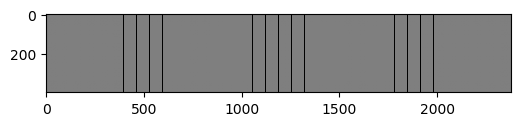

Epoch 1: 14.03 sec
Loss: 0.13



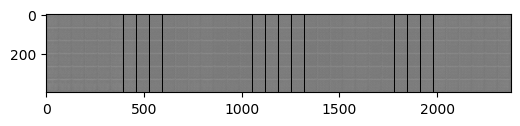

Epoch 2: 15.23 sec
Loss: 0.11



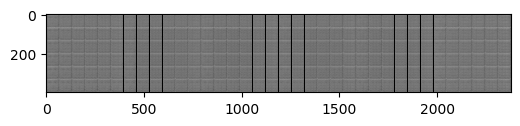

Epoch 3: 14.90 sec
Loss: 0.11



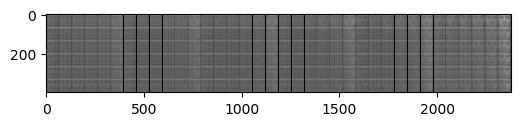

Epoch 4: 15.02 sec
Loss: 0.11



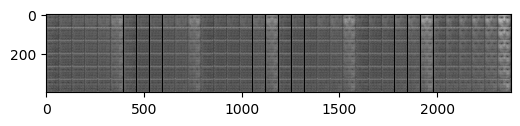

Epoch 5: 14.21 sec
Loss: 0.11



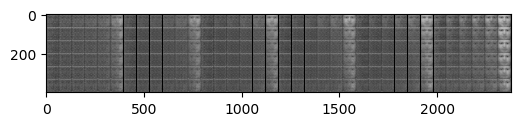

Epoch 6: 15.35 sec
Loss: 0.10



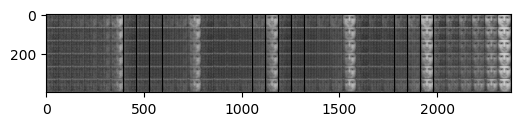

Epoch 7: 16.01 sec
Loss: 0.10



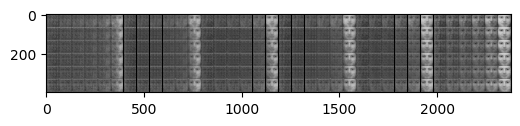

Epoch 8: 16.26 sec
Loss: 0.09



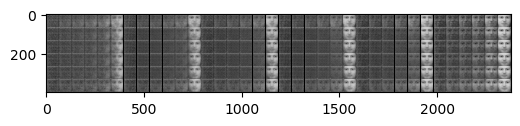

Epoch 9: 13.80 sec
Loss: 0.09



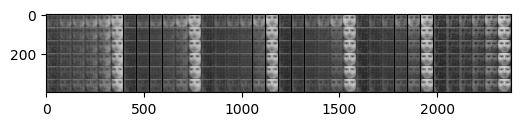

Epoch 10: 16.11 sec
Loss: 0.09



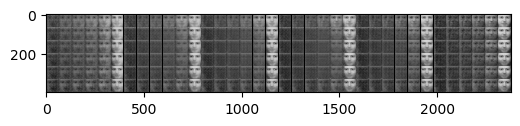

Epoch 11: 17.05 sec
Loss: 0.09



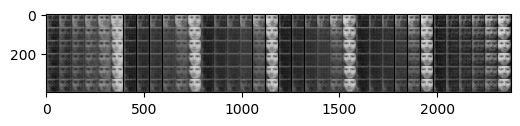

Epoch 12: 13.27 sec
Loss: 0.09



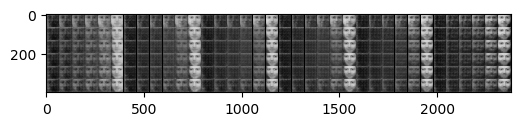

Epoch 13: 14.31 sec
Loss: 0.09



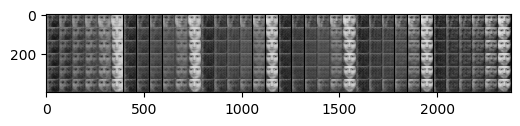

Epoch 14: 20.17 sec
Loss: 0.09



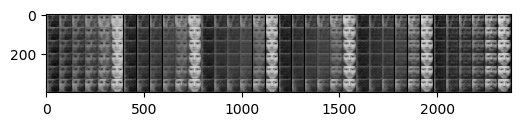

Epoch 15: 14.87 sec
Loss: 0.08



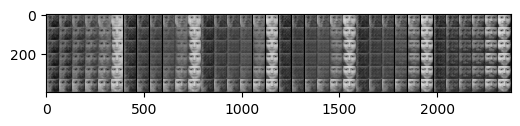

Epoch 16: 18.29 sec
Loss: 0.08



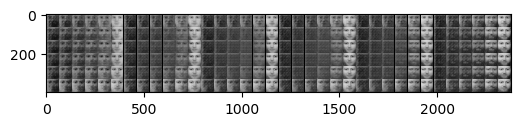

Epoch 17: 15.07 sec
Loss: 0.08



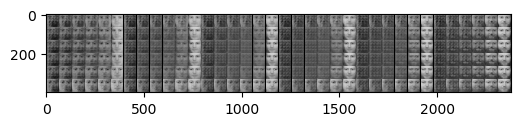

Epoch 18: 16.51 sec
Loss: 0.08



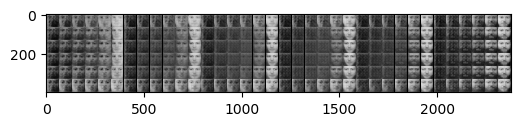

Epoch 19: 17.61 sec
Loss: 0.08



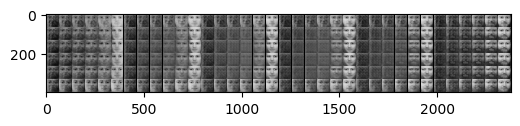

Epoch 20: 16.29 sec
Loss: 0.08



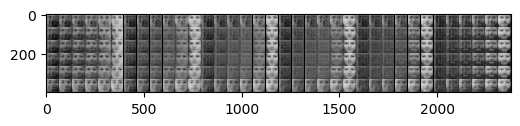

Epoch 21: 16.02 sec
Loss: 0.08



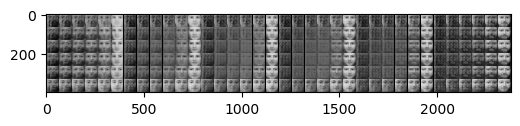

Epoch 22: 15.89 sec
Loss: 0.08



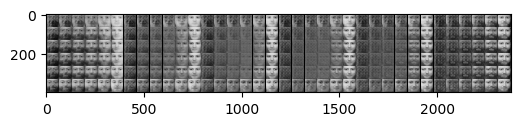

Epoch 23: 15.70 sec
Loss: 0.08



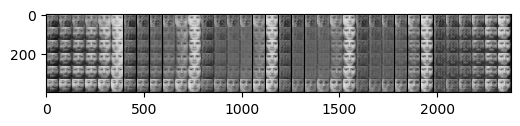

Epoch 24: 15.49 sec
Loss: 0.08



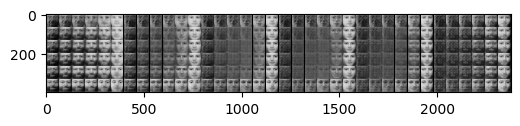

Epoch 25: 16.95 sec
Loss: 0.08



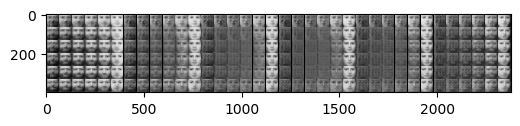

Epoch 26: 14.98 sec
Loss: 0.08



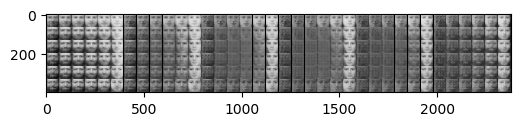

Epoch 27: 14.01 sec
Loss: 0.08



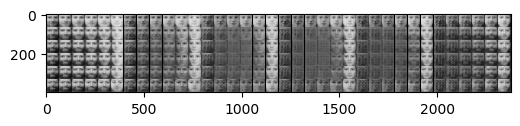

Epoch 28: 21.67 sec
Loss: 0.08



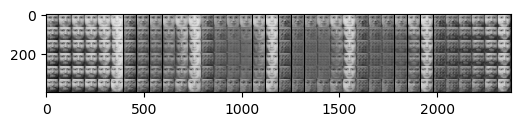

Epoch 29: 18.40 sec
Loss: 0.08



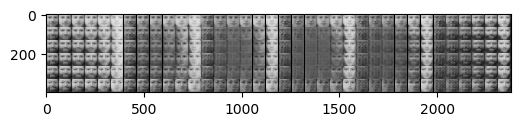

Epoch 30: 18.36 sec
Loss: 0.08



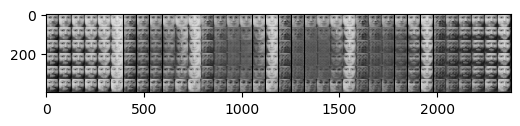

Epoch 31: 21.51 sec
Loss: 0.08



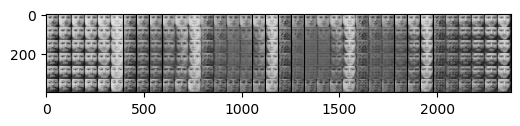

Epoch 32: 14.81 sec
Loss: 0.08



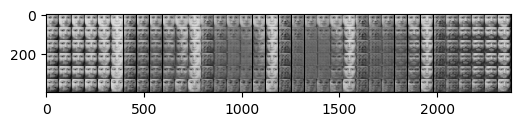

Epoch 33: 15.92 sec
Loss: 0.08



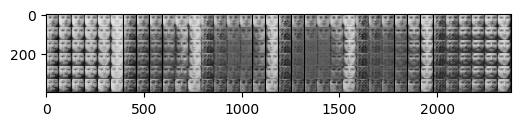

Epoch 34: 13.26 sec
Loss: 0.08



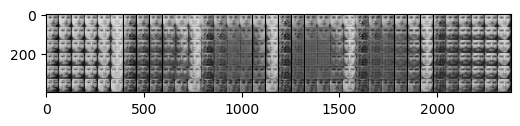

Epoch 35: 13.14 sec
Loss: 0.08



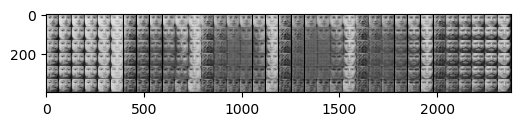

Epoch 36: 15.75 sec
Loss: 0.08



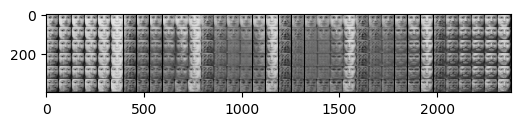

Epoch 37: 16.43 sec
Loss: 0.08



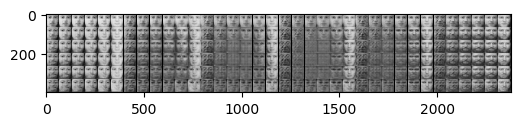

Epoch 38: 16.88 sec
Loss: 0.08



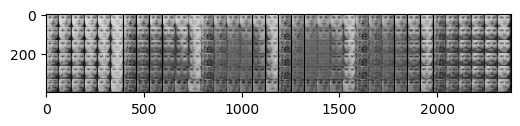

Epoch 39: 15.75 sec
Loss: 0.08



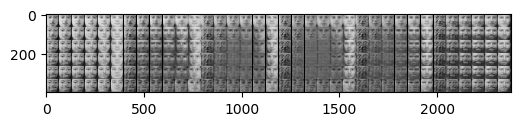

Epoch 40: 14.54 sec
Loss: 0.08



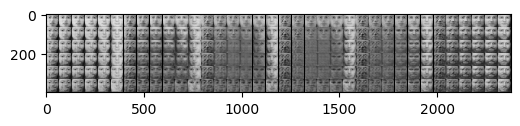

Epoch 41: 15.87 sec
Loss: 0.07



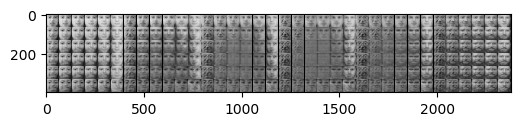

Epoch 42: 19.20 sec
Loss: 0.08



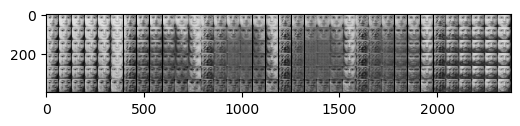

Epoch 43: 16.40 sec
Loss: 0.08



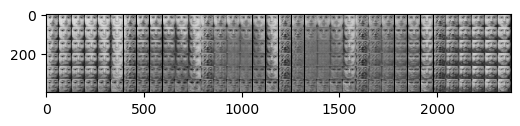

Epoch 44: 18.09 sec
Loss: 0.07



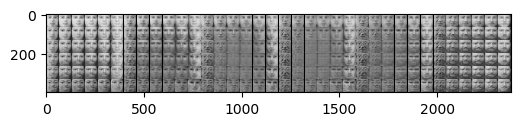

Epoch 45: 15.34 sec
Loss: 0.07



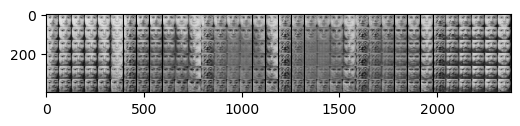

Epoch 46: 17.36 sec
Loss: 0.08



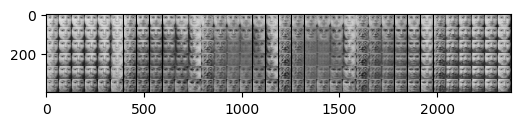

Epoch 47: 17.67 sec
Loss: 0.07



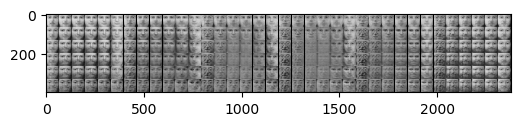

Epoch 48: 16.77 sec
Loss: 0.07



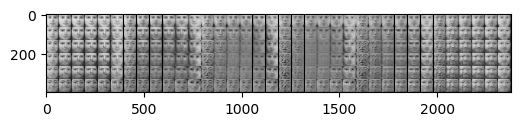

Epoch 49: 15.90 sec
Loss: 0.07



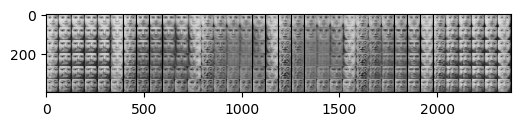

Epoch 50: 15.99 sec
Loss: 0.07



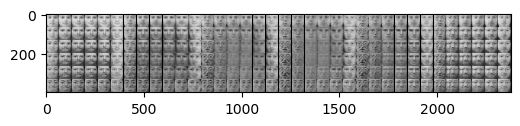

Epoch 51: 15.75 sec
Loss: 0.07



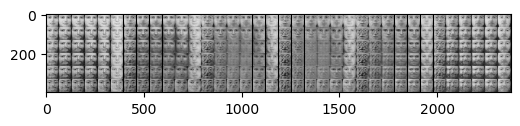

Epoch 52: 16.53 sec
Loss: 0.07



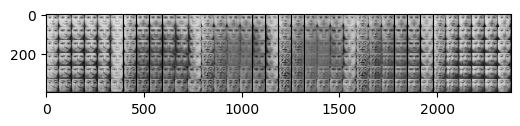

Epoch 53: 13.35 sec
Loss: 0.07



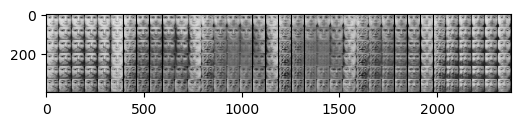

Epoch 54: 15.38 sec
Loss: 0.07



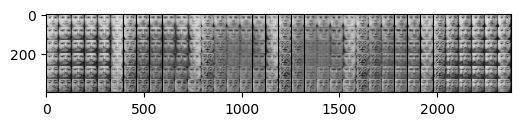

Epoch 55: 16.31 sec
Loss: 0.07



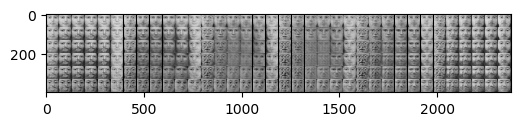

Epoch 56: 24.07 sec
Loss: 0.07



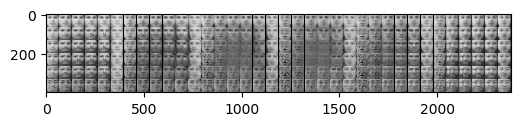

Epoch 57: 15.73 sec
Loss: 0.07



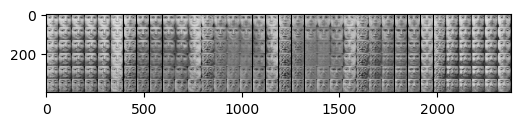

Epoch 58: 15.24 sec
Loss: 0.07



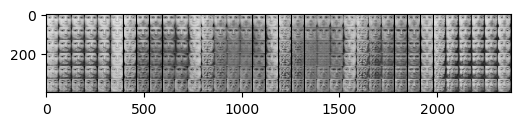

Epoch 59: 15.96 sec
Loss: 0.07



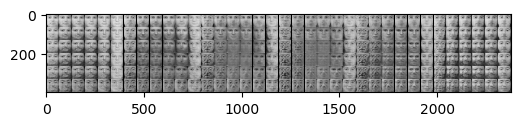

Epoch 60: 16.78 sec
Loss: 0.07



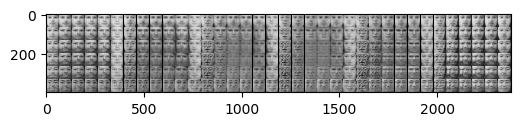

Epoch 61: 14.53 sec
Loss: 0.07



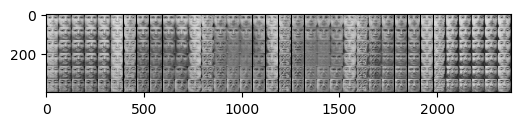

Epoch 62: 15.48 sec
Loss: 0.07



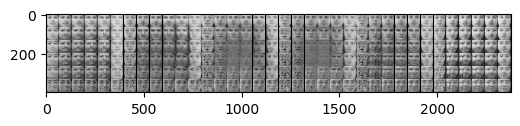

Epoch 63: 15.75 sec
Loss: 0.07



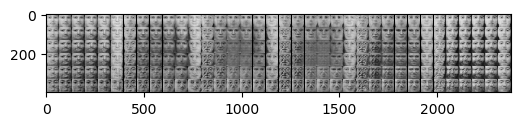

Epoch 64: 15.83 sec
Loss: 0.07



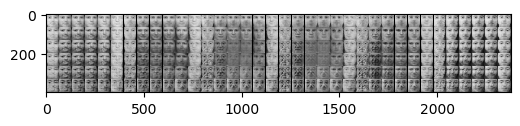

Epoch 65: 16.00 sec
Loss: 0.07



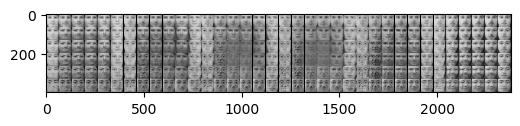

Epoch 66: 15.79 sec
Loss: 0.07



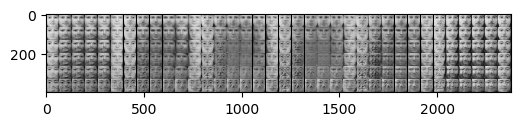

Epoch 67: 16.29 sec
Loss: 0.07



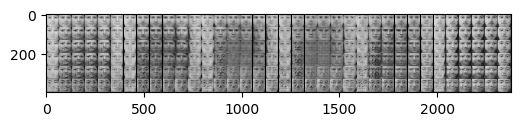

Epoch 68: 15.13 sec
Loss: 0.07



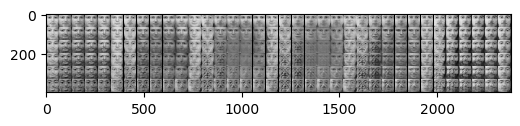

Epoch 69: 15.73 sec
Loss: 0.07



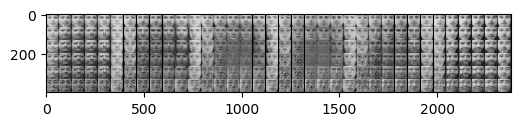

Epoch 70: 15.98 sec
Loss: 0.07



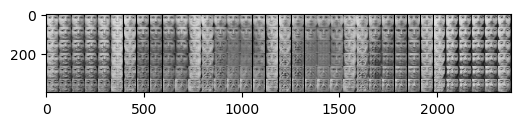

Epoch 71: 15.41 sec
Loss: 0.07



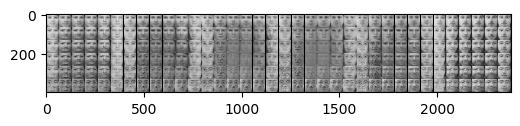

Epoch 72: 17.09 sec
Loss: 0.07



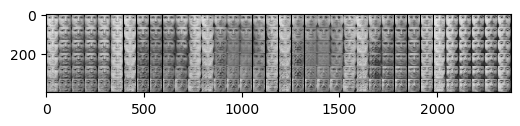

Epoch 73: 17.75 sec
Loss: 0.07



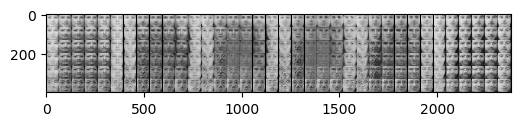

Epoch 74: 16.23 sec
Loss: 0.07



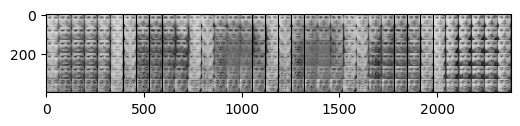

Epoch 75: 14.07 sec
Loss: 0.07



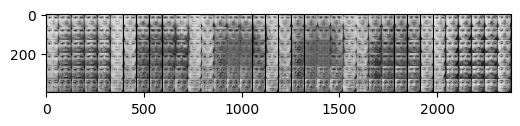

Epoch 76: 13.76 sec
Loss: 0.07



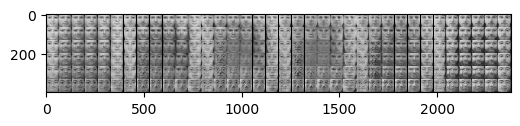

Epoch 77: 15.82 sec
Loss: 0.07



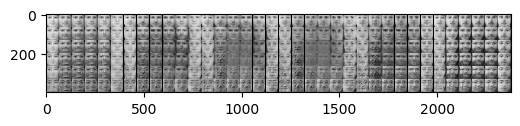

Epoch 78: 16.37 sec
Loss: 0.07



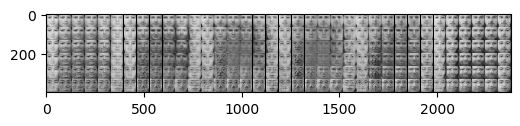

Epoch 79: 16.31 sec
Loss: 0.07



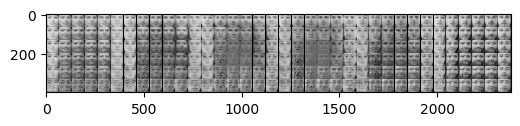

Epoch 80: 15.79 sec
Loss: 0.07



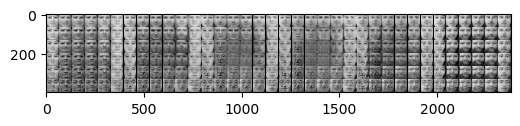

Epoch 81: 14.92 sec
Loss: 0.07



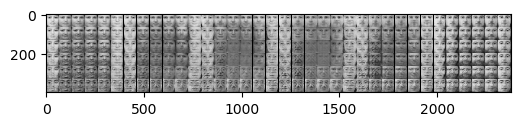

Epoch 82: 15.82 sec
Loss: 0.07



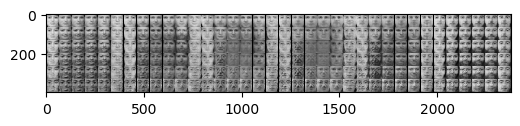

Epoch 83: 13.42 sec
Loss: 0.07



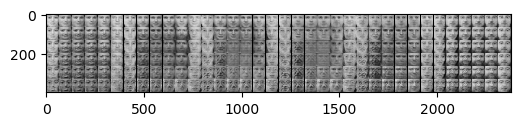

Epoch 84: 17.82 sec
Loss: 0.07



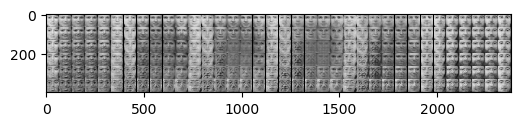

Epoch 85: 16.16 sec
Loss: 0.07



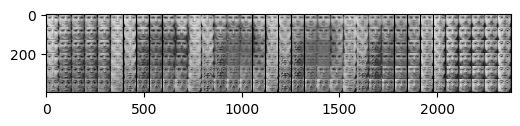

Epoch 86: 19.90 sec
Loss: 0.07



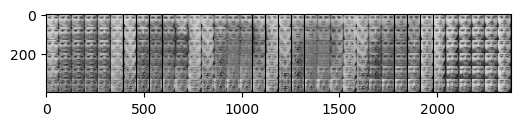

Epoch 87: 16.40 sec
Loss: 0.07



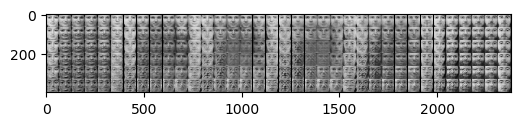

Epoch 88: 15.09 sec
Loss: 0.07



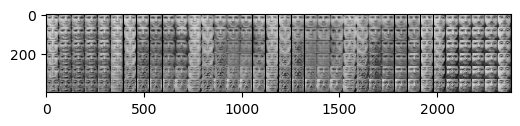

Epoch 89: 16.37 sec
Loss: 0.07



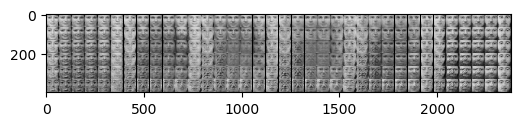

Epoch 90: 15.60 sec
Loss: 0.07



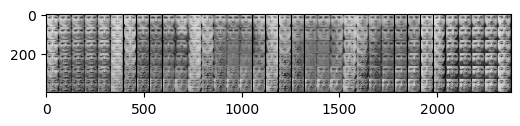

Epoch 91: 16.23 sec
Loss: 0.07



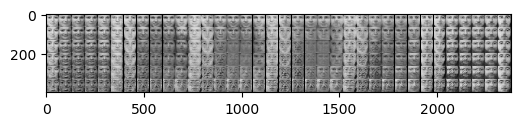

Epoch 92: 15.65 sec
Loss: 0.07



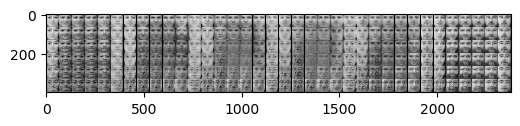

Epoch 93: 14.76 sec
Loss: 0.07



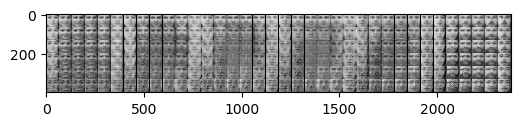

Epoch 94: 14.78 sec
Loss: 0.07



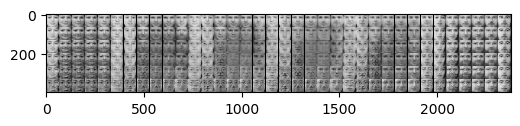

Epoch 95: 15.72 sec
Loss: 0.07



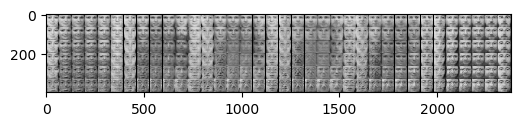

Epoch 96: 17.54 sec
Loss: 0.07



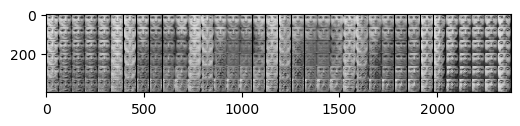

Epoch 97: 15.12 sec
Loss: 0.07



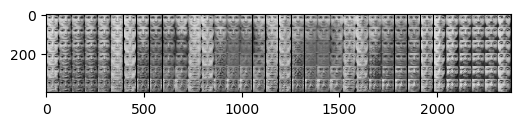

Epoch 98: 18.89 sec
Loss: 0.07



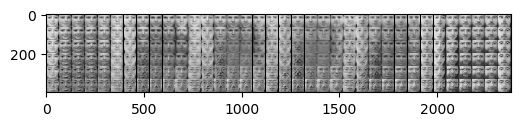

Epoch 99: 15.82 sec
Loss: 0.07



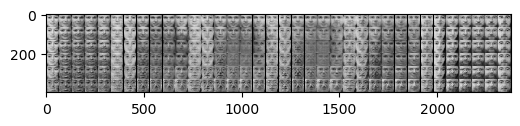

Epoch 100: 16.07 sec
Loss: 0.07



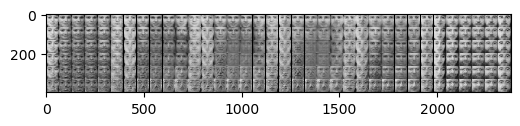

Epoch 101: 15.82 sec
Loss: 0.07



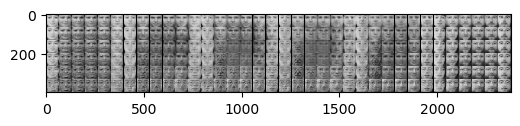

Epoch 102: 16.11 sec
Loss: 0.07



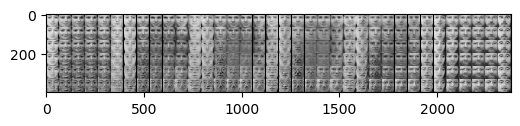

Epoch 103: 15.89 sec
Loss: 0.07



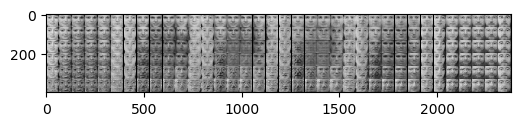

Epoch 104: 14.22 sec
Loss: 0.07



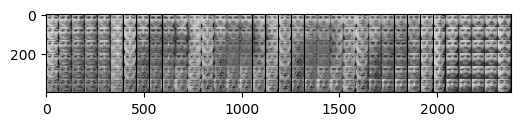

Epoch 105: 13.26 sec
Loss: 0.07



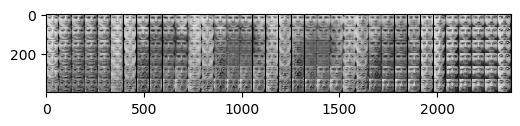

Epoch 106: 15.61 sec
Loss: 0.07



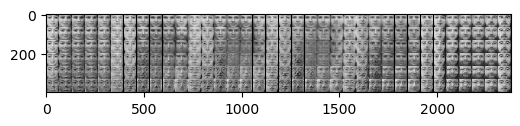

Epoch 107: 16.18 sec
Loss: 0.07



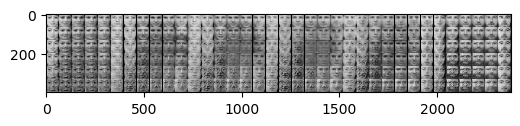

Epoch 108: 16.25 sec
Loss: 0.07



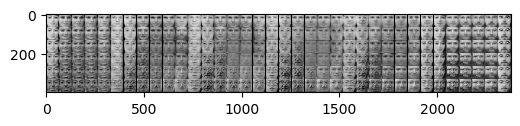

Epoch 109: 16.29 sec
Loss: 0.07



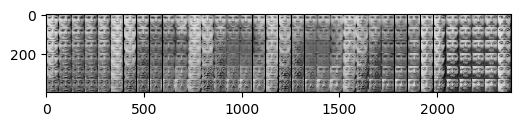

Epoch 110: 16.72 sec
Loss: 0.07



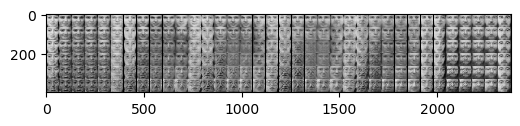

Epoch 111: 15.58 sec
Loss: 0.07



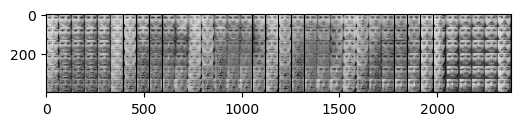

Epoch 112: 18.44 sec
Loss: 0.06



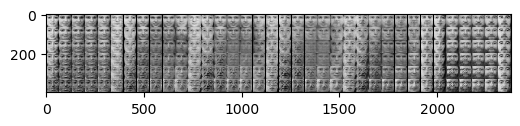

Epoch 113: 15.59 sec
Loss: 0.07



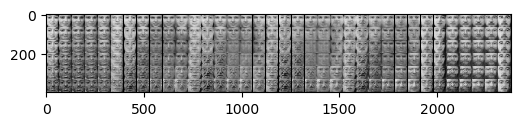

Epoch 114: 16.41 sec
Loss: 0.06



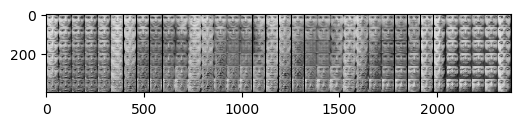

Epoch 115: 16.95 sec
Loss: 0.06



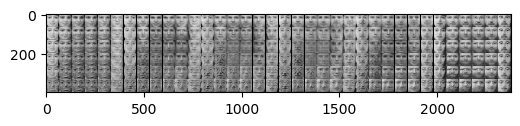

Epoch 116: 15.51 sec
Loss: 0.07



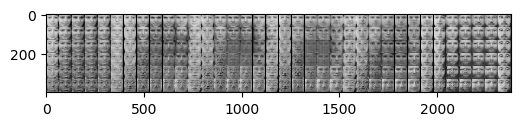

Epoch 117: 11.77 sec
Loss: 0.06



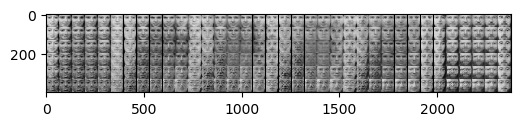

Epoch 118: 14.34 sec
Loss: 0.06



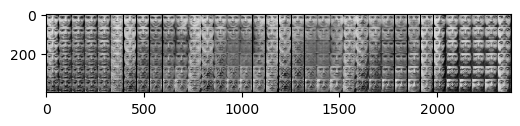

Epoch 119: 15.92 sec
Loss: 0.06



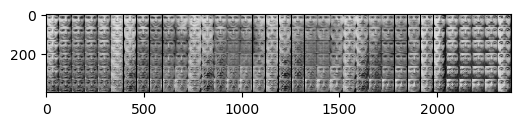

Epoch 120: 17.02 sec
Loss: 0.06



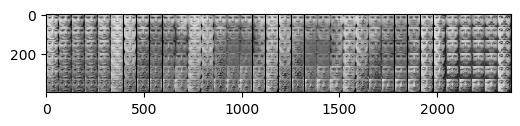

Epoch 121: 14.42 sec
Loss: 0.07



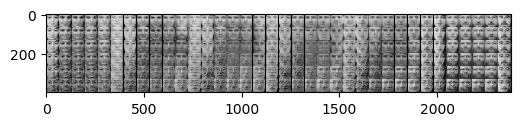

Epoch 122: 16.05 sec
Loss: 0.06



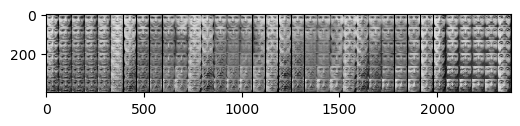

Epoch 123: 13.75 sec
Loss: 0.06



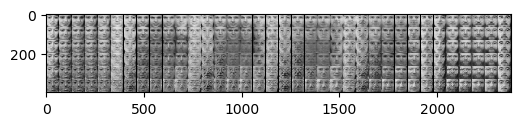

Epoch 124: 15.31 sec
Loss: 0.06



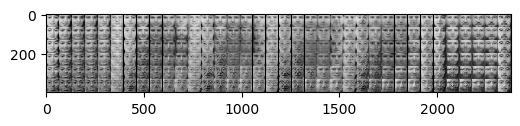

Epoch 125: 14.68 sec
Loss: 0.06



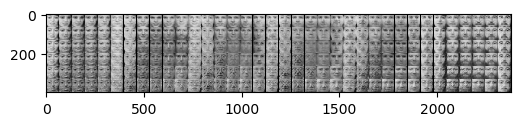

Epoch 126: 17.84 sec
Loss: 0.06



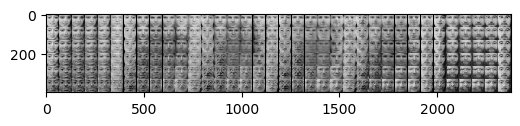

Epoch 127: 15.56 sec
Loss: 0.06



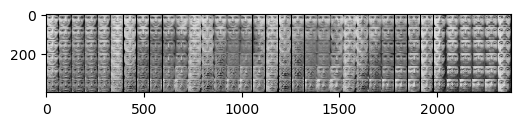

Epoch 128: 14.27 sec
Loss: 0.06



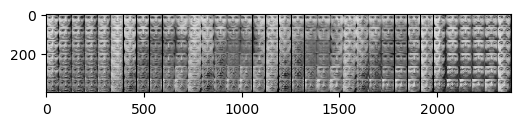

Epoch 129: 15.89 sec
Loss: 0.06



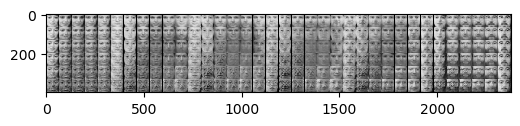

Epoch 130: 16.44 sec
Loss: 0.06



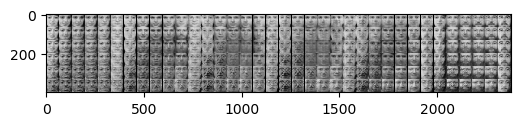

Epoch 131: 17.00 sec
Loss: 0.06



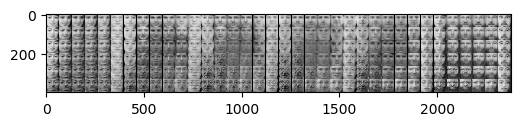

Epoch 132: 15.80 sec
Loss: 0.06



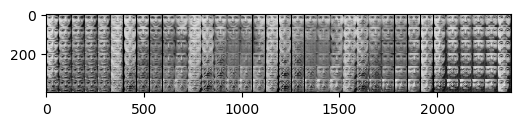

Epoch 133: 12.30 sec
Loss: 0.06



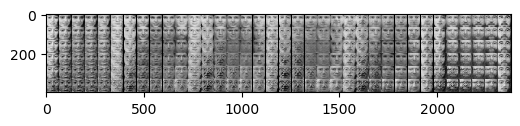

Epoch 134: 13.79 sec
Loss: 0.06



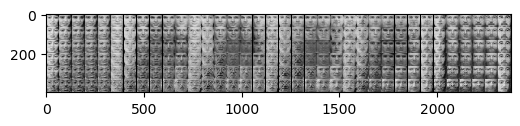

Epoch 135: 14.84 sec
Loss: 0.06



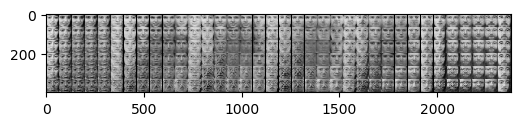

Epoch 136: 15.29 sec
Loss: 0.06



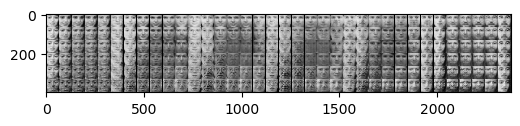

Epoch 137: 17.93 sec
Loss: 0.06



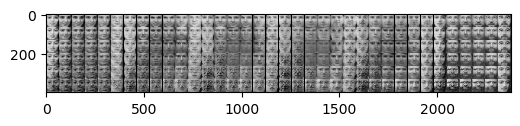

Epoch 138: 15.60 sec
Loss: 0.06



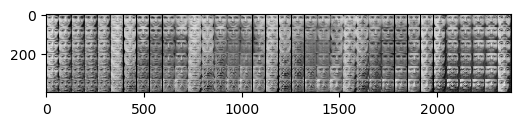

Epoch 139: 16.07 sec
Loss: 0.06



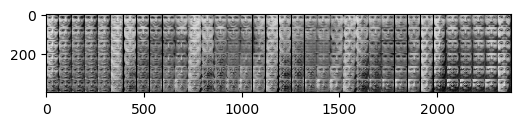

Epoch 140: 19.71 sec
Loss: 0.06



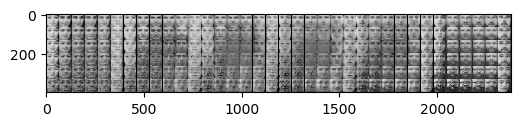

Epoch 141: 14.94 sec
Loss: 0.07



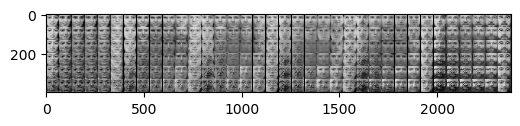

Epoch 142: 15.41 sec
Loss: 0.06



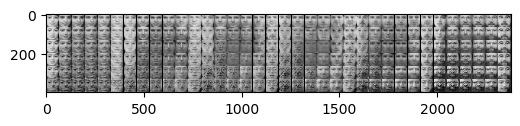

Epoch 143: 15.70 sec
Loss: 0.07



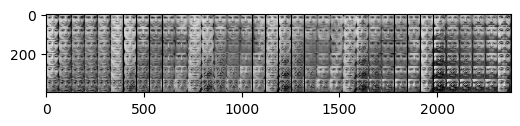

Epoch 144: 14.39 sec
Loss: 0.07



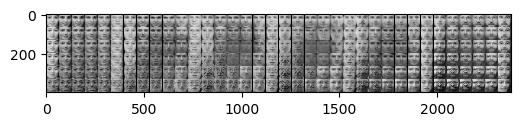

Epoch 145: 15.63 sec
Loss: 0.06



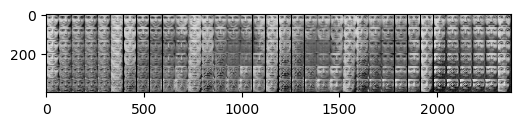

Epoch 146: 15.78 sec
Loss: 0.07



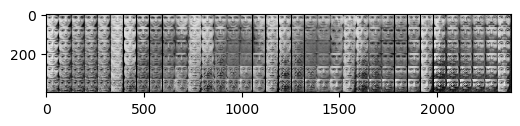

Epoch 147: 12.18 sec
Loss: 0.06



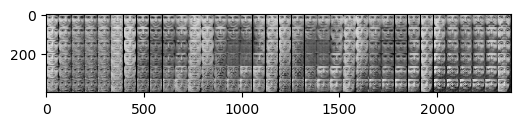

Epoch 148: 14.18 sec
Loss: 0.07



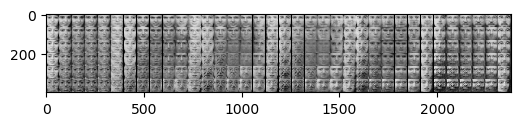

Epoch 149: 17.53 sec
Loss: 0.06



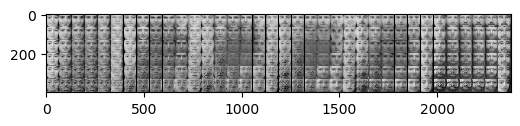

Epoch 150: 18.94 sec
Loss: 0.06



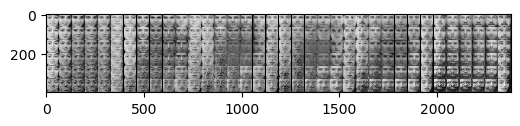

Epoch 151: 18.93 sec
Loss: 0.06



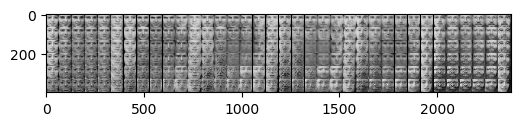

Epoch 152: 15.75 sec
Loss: 0.07



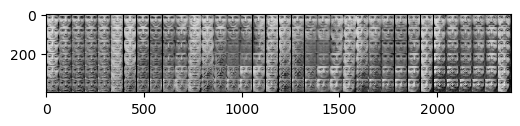

Epoch 153: 14.87 sec
Loss: 0.06



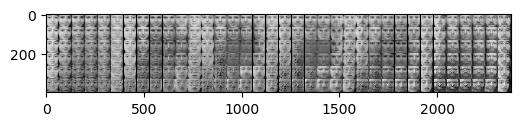

Epoch 154: 18.83 sec
Loss: 0.07



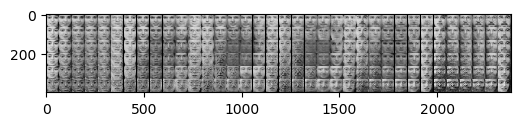

Epoch 155: 15.59 sec
Loss: 0.07



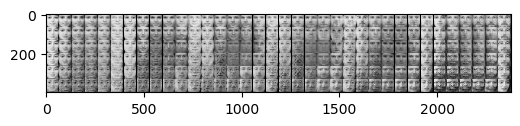

Epoch 156: 15.94 sec
Loss: 0.07



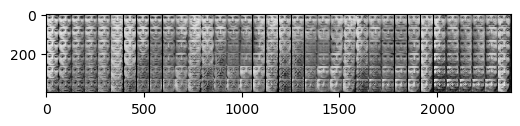

Epoch 157: 15.25 sec
Loss: 0.07



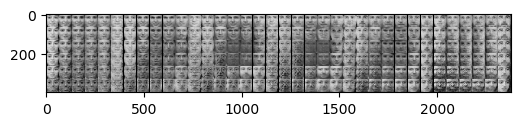

Epoch 158: 15.53 sec
Loss: 0.07



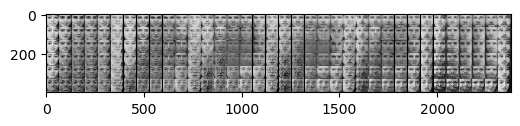

Epoch 159: 16.12 sec
Loss: 0.07



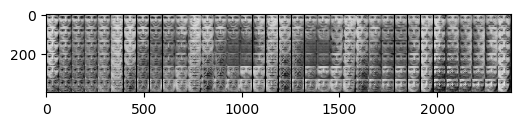

Epoch 160: 16.94 sec
Loss: 0.07



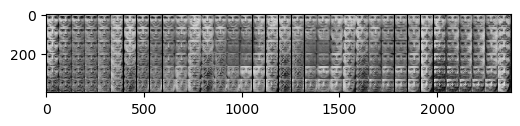

Epoch 161: 15.73 sec
Loss: 0.07



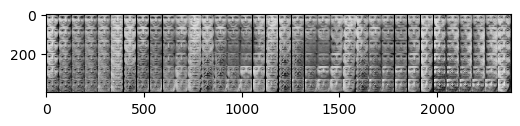

Epoch 162: 15.88 sec
Loss: 0.07



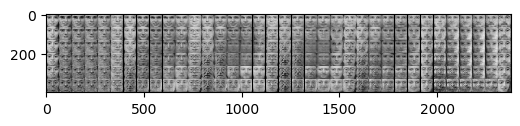

Epoch 163: 16.72 sec
Loss: 0.08



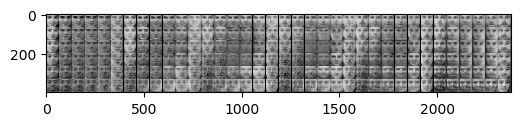

Epoch 164: 16.07 sec
Loss: 0.07



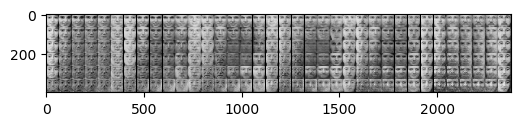

Epoch 165: 15.84 sec
Loss: 0.07



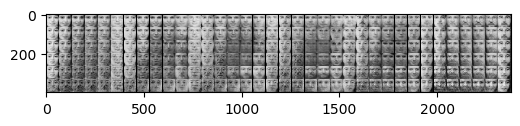

Epoch 166: 17.53 sec
Loss: 0.07



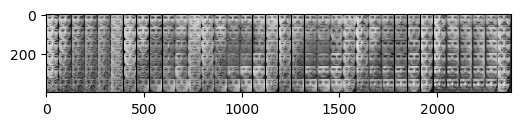

Epoch 167: 16.17 sec
Loss: 0.07



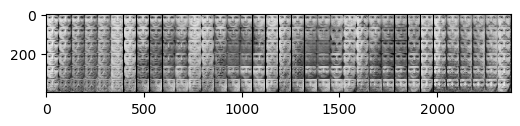

Epoch 168: 26.60 sec
Loss: 0.07



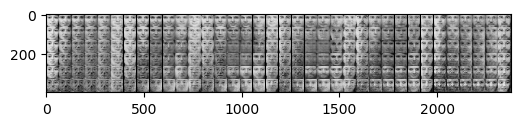

Epoch 169: 16.49 sec
Loss: 0.07



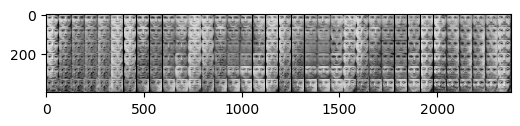

Epoch 170: 16.89 sec
Loss: 0.07



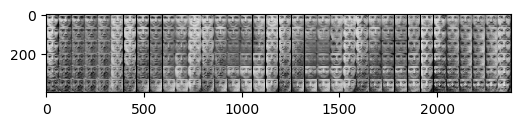

Epoch 171: 13.61 sec
Loss: 0.07



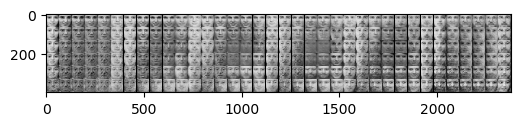

Epoch 172: 15.96 sec
Loss: 0.07



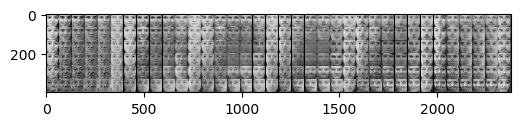

Epoch 173: 15.62 sec
Loss: 0.07



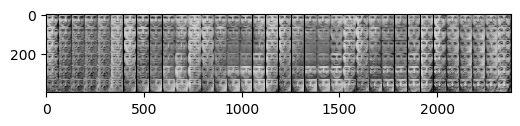

Epoch 174: 15.45 sec
Loss: 0.07



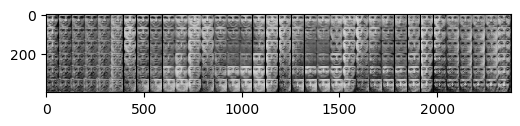

Epoch 175: 16.90 sec
Loss: 0.07



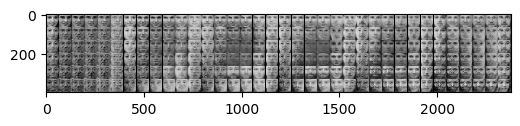

Epoch 176: 15.66 sec
Loss: 0.07



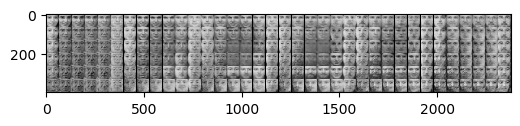

Epoch 177: 16.64 sec
Loss: 0.07



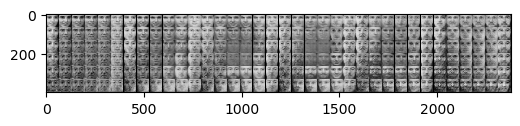

Epoch 178: 14.84 sec
Loss: 0.07



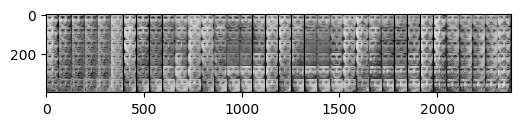

Epoch 179: 15.56 sec
Loss: 0.07



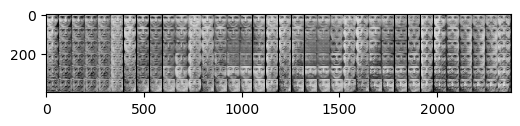

Epoch 180: 14.80 sec
Loss: 0.07



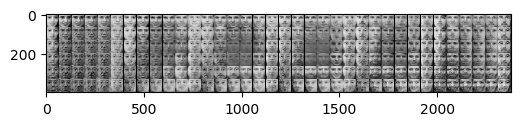

Epoch 181: 15.22 sec
Loss: 0.07



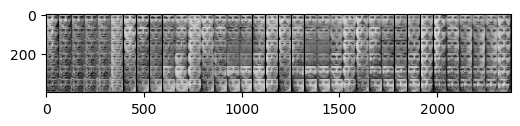

Epoch 182: 19.86 sec
Loss: 0.07



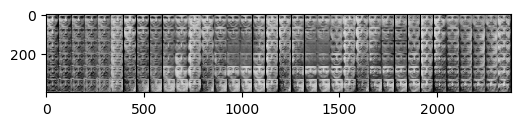

Epoch 183: 16.71 sec
Loss: 0.07



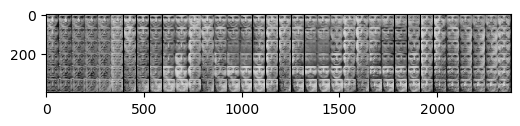

Epoch 184: 14.42 sec
Loss: 0.07



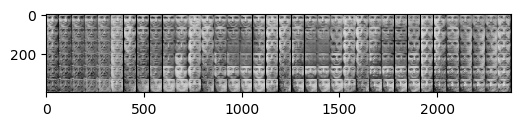

Epoch 185: 14.89 sec
Loss: 0.07



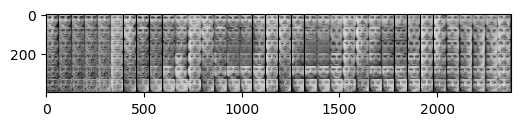

Epoch 186: 15.78 sec
Loss: 0.07



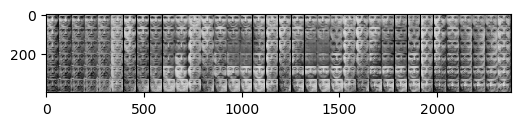

Epoch 187: 16.81 sec
Loss: 0.07



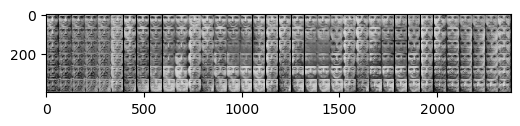

Epoch 188: 15.62 sec
Loss: 0.07



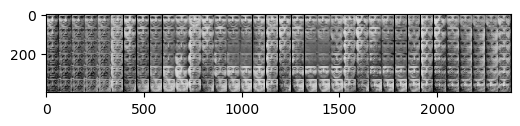

Epoch 189: 16.38 sec
Loss: 0.07



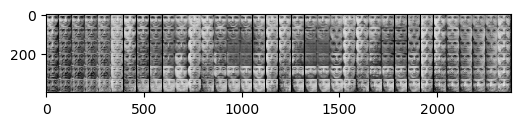

Epoch 190: 17.42 sec
Loss: 0.06



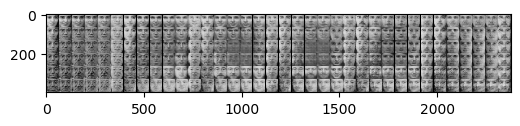

Epoch 191: 20.56 sec
Loss: 0.06



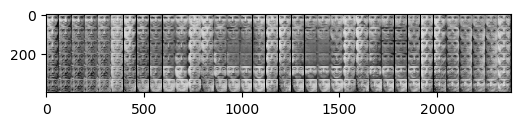

Epoch 192: 16.12 sec
Loss: 0.07



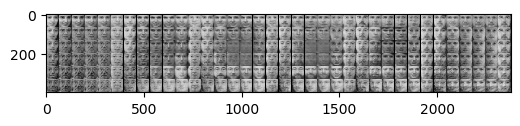

Epoch 193: 17.32 sec
Loss: 0.07



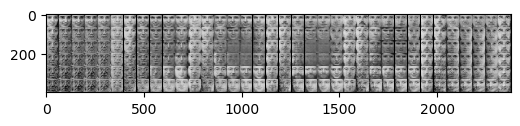

Epoch 194: 13.60 sec
Loss: 0.07



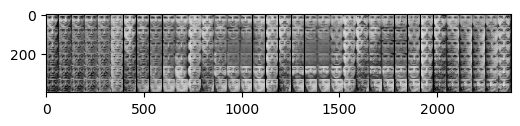

Epoch 195: 15.65 sec
Loss: 0.07



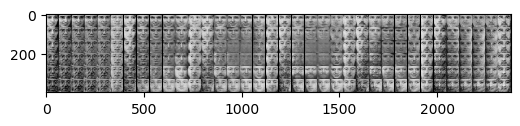

Epoch 196: 20.13 sec
Loss: 0.07



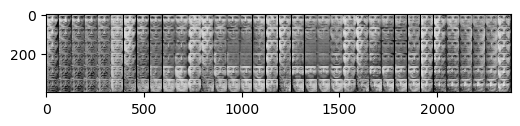

Epoch 197: 15.31 sec
Loss: 0.06



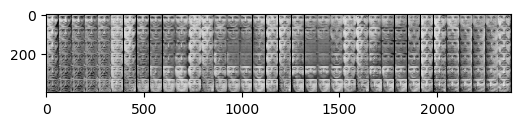

Epoch 198: 15.06 sec
Loss: 0.07



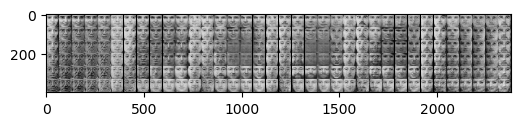

Epoch 199: 15.59 sec
Loss: 0.07



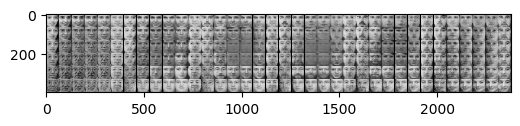

Epoch 200: 18.15 sec
Loss: 0.07



In [75]:
for epoch in range(1, n_epochs + 1):
    current_epoch_losses = []
    with Timer('Epoch %d' % epoch):
        for iters, (data,) in enumerate(my_dataloader):            
                # batch_size x dim_1 x ... x dim_k
                real = data.to(device)

                torch.backends.cudnn.benchmark=True  # temporary speed-up
                netG.eval()
                
                # batch_size x n_gaussian
                best_z = bcs.optimize(real)
                
                netG.train()
                torch.backends.cudnn.benchmark=False


                if True:
                    best_z = best_z.reshape(batch_size, n_gaussian, 1, 1)

                # batch_size x dim_1 x ... x dim_k
                fake = netG(best_z)
                
                best_z_all.append(best_z.cpu().numpy().squeeze())
        #         x_train = latent_code_dist.sample(latent_batch_size).to(device)
        #         y_train = real.repeat(latent_batch_size, 1)

        #         y_pred = row_wise_repeat(netG(x_train), batch_size)

        #         loss_all_modes = loss_fn(y_pred, y_train)

                # in case we are predicting images with a fully connected net, we have to give it appropriate width and height!
                fake = fake.reshape(real.shape)
                loss = criterion(real, fake)
                # Zero the gradients before running the backward pass.
                optimizer.zero_grad()
        #         selective_loss = loss_all_modes.mean(dim=1).reshape(latent_batch_size, batch_size).min(dim=0)[0].sum()
                loss.backward()        

                current_epoch_losses.append(loss)

                optimizer.step()

                if iters % 50 == 0:  
                    netG.eval()
                    with torch.no_grad():
                        fake = netG(fixed_noise).detach().cpu()  # * dataset_std + dataset_mean
                    netG.train()
                    
                    img_list.append(vutils.make_grid(fake, nrow=36, padding=2, normalize=False))
                    plt.figure(dpi=100)
                    plt.imshow(img_list[-1].numpy().transpose(1,2,0))
                    plt.show()
    
    loss_log.append(torch.tensor(current_epoch_losses).mean().detach().numpy())
    print('Loss: {:.2f}'.format(loss_log[-1]) + '\n' + '=' * 22 + '\n')

In [86]:
# fig = plt.figure(figsize=(8,8))
# plt.axis("off")
# ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
# ani = animation.ArtistAnimation(fig, [im for i, im in enumerate(ims) if i%5==0], interval=30, repeat_delay=1000, blit=True)

# HTML(ani.to_jshtml())

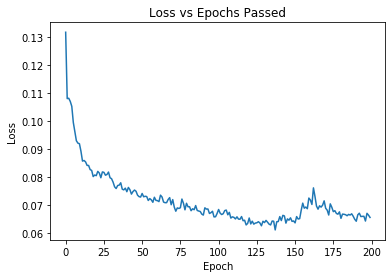

In [87]:
plt.figure()
plt.title('Loss vs Epochs Passed')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.plot(range(len(loss_log)), loss_log)
plt.show()

In [88]:
netG.eval()

DataParallel(
  (module): Generator(
    (main): Sequential(
      (0): ConvTranspose2d(3, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (8): ReLU(inplace=True)
      (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (11): ReLU(inplace=True)
      (12): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2),

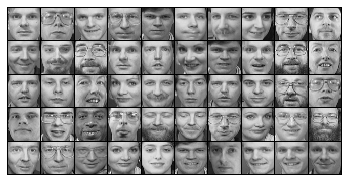

In [89]:
from scipy.stats import norm

grid_width = 10

x1 = np.linspace(0.02, 0.98, grid_width)
x2 = np.linspace(0.02, 0.98, grid_width)
x1, x2 = norm.ppf(x1), norm.ppf(x2)  # apply inverse normal cdf to distribute codes equally across the distribution

xv1, xv2 = np.meshgrid(x1, x2)
xv1, xv2 = xv1.reshape(-1, 1), xv2.reshape(-1, 1)

y_pred = data.cpu()

img = torchvision.utils.make_grid(y_pred, nrow=grid_width, padding=2, normalize=True, range=None, scale_each=False, pad_value=0)

plt.imshow(np.transpose(img, (1,2,0)))
plt.axis('off') 

plt.show()

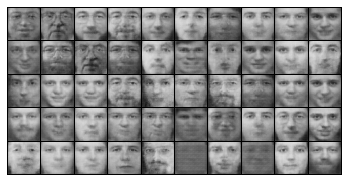

In [90]:
from scipy.stats import norm
import cv2 as cv

grid_width = 10

if True:
    x_test = torch.randn(batch_size, n_gaussian, 1, 1, device=device)
else:
    x_test = torch.randn(batch_size, n_gaussian, device=device)

y_pred = netG(x_test).detach().cpu().reshape(-1, 1, img_size, img_size)
# y_pred = torch.min(torch.ones(y_pred.shape),torch.max(torch.zeros(y_pred.shape), y_pred * .13 + dataset_mean))
# y_pred = y_pred.transpose(3,2)

img = torchvision.utils.make_grid(y_pred, nrow=grid_width, padding=2, normalize=False, range=None, scale_each=True, pad_value=0)

# plt.figure(dpi = 200)
plt.imshow(np.transpose(img, (1,2,0)))
plt.axis('off') 
                            
plt.show()


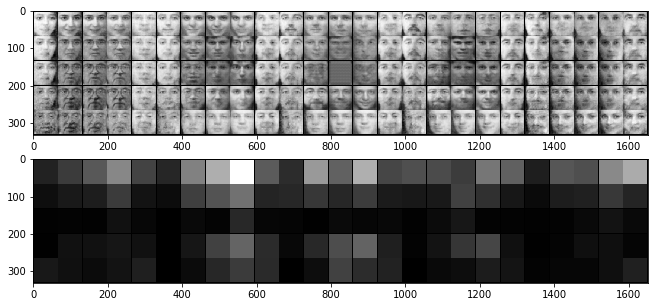

In [99]:
from scipy.stats import norm
import cv2 as cv
from itertools import product

grid_width = 5
cdf_begin = 0.01; cdf_end = 1 - cdf_begin
x1 = np.linspace(cdf_begin, cdf_end, grid_width)
x1 = norm.ppf(x1)
x1 = torch.tensor(x1, device=device, dtype=torch.float32)

x_test = torch.cat([xv.unsqueeze(-1) for xv in torch.meshgrid([x1]*3)], dim=-1)  # so that: x_test[i,j,k,:] = x1[i], x1[j], x1[k]
x_test = x_test.reshape(-1, n_gaussian, 1, 1)

with torch.no_grad():
    netG.eval()
    y_pred = netG(x_test).reshape(-1, 1, img_size, img_size).cpu()
#     y_pred = torch.cat([netG(x_test_instance.unsqueeze(0)).reshape(-1, 1, img_size, img_size).cpu()
#                        for x_test_instance in x_test])  # batch size of 1 to avoid batchnorm issues at test time
# y_pred = y_pred.transpose(3,2)

# nrow = int(np.sqrt(len(y_pred)))
nrow=grid_width ** 2
img = torchvision.utils.make_grid(y_pred, nrow=nrow, padding=2, normalize=True, range=None, scale_each=False, pad_value=0)

I = np.ndarray.astype(img[0].numpy() * 255, np.uint8)
cv.imwrite('./fig-faces.png', I)
plt.figure(figsize=(grid_width ** 2, grid_width))#, dpi=(img_size+2))
plt.subplot(211)
plt.imshow(I, cmap='gray')

# ------------------ Histogram -------------------
bin_width = (cdf_end - cdf_begin)/(grid_width-1)
bin_edges = np.linspace(cdf_begin + bin_width/2, 
                        cdf_end - bin_width/2, 
                        grid_width-1)
bin_edges = np.concatenate(([max(0, cdf_begin - bin_width/2)], 
                            bin_edges, 
                            [min(1, cdf_end + bin_width/2)]))
bin_edges = norm.ppf(bin_edges)
# h, _ = np.histogramdd(np.vstack(best_z_all), bins=[bin_edges]*n_gaussian, normed=True)
h, _ = np.histogramdd(np.vstack(best_z_all), bins=[bin_edges]*n_gaussian)

h_vis = np.tile(h.reshape(-1, 1, 1, 1), (1, 1, img_size, img_size))
img_h = torchvision.utils.make_grid(torch.tensor(h_vis), nrow=nrow, padding=2, normalize=True, range=None, scale_each=False, pad_value=0)

plt.subplot(212)
plt.imshow(img_h[0], cmap='gray')